In [1]:
#pip install emoji

In [2]:
import regex as re
import pandas as pd

import numpy as np
import emoji
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [3]:
def date_time(s):
    pattern = '^([0-9]+)(\/)([0-9]+)(\/)([0-9]+), ([0-9]+):([0-9]+)[ ]?(AM|PM|am|pm)? -'
    pattern_for_24hr_format = "^([01]?[0-9]|2[0-3]):[0-5][0-9]$"
    
    result = re.match(pattern, s)
    if result:
        return True
    return False

def find_author(s):
#     s = s.split(":")
    s = s.split(':', 1)  # added😎 
    if len(s)==2:
        return True
    else:
        return False

def getDatapoint(line):
    splitline = line.split(' - ')
    dateTime = splitline[0]
    date, time = dateTime.split(", ")
    message = " ".join(splitline[1:])
    if find_author(message):
        splitmessage = message.split(": ")
        author = splitmessage[0]
        message = " ".join(splitmessage[1:])
    else:
        author= None
    return date, time, author, message

In [4]:
data = []
conversation = 'groupchat.txt'
with open(conversation, encoding="utf-8") as fp:
    fp.readline()
    messageBuffer = []
    date, time, author = None, None, None
    while True:
        line = fp.readline()
        if not line:
            break
        line = line.strip()
        if date_time(line):
            if len(messageBuffer) > 0:
                data.append([date, time, author, ' '.join(messageBuffer)])
            messageBuffer.clear()
            date, time, author, message = getDatapoint(line)
            messageBuffer.append(message)
        else:
            messageBuffer.append(line)

In [5]:
data

[['22/07/2022', '11:07 am', None, 'You were added'],
 ['13/09/2022',
  '8:48 am',
  "Khushwant Virdi Ma'am",
  'Only 27 response are there'],
 ['13/09/2022',
  '9:03 am',
  "Khushwant Virdi Ma'am",
  "Jo rehte hai unko call kr k sheet fill karvayu ya ese hi kar loge..  Agar aap meri help nahi kar rahe. Don't expect any kind of help and favour from my side."],
 ['13/09/2022',
  '9:58 am',
  "Khushwant Virdi Ma'am",
  'Thought of today...  A positive mind finds opportunity in everything but a  negative mind finds fault in everything.'],
 ['13/09/2022', '12:00 pm', None, "Khushwant Virdi Ma'am added Chatura"],
 ['13/09/2022',
  '12:01 pm',
  "Khushwant Virdi Ma'am",
  'Hurry up students.. Those who are left fill the sheet'],
 ['13/09/2022',
  '1:34 pm',
  "Khushwant Virdi Ma'am",
  'Binod kumar shah Dev sharma Eshupreet gurpreet singh Harpreet singh Jasleen kaur Jaspreet kaur Mukesh kumar Pawan kumar Priya Rahul dhunna Ritik kumar Saikat biswas Satnam singh Sukhmanpreet kaur Ummey ushba U

In [6]:
df = pd.DataFrame(data, columns=["Date", 'Time', 'Author', 'Message'])
df['Date'] = pd.to_datetime(df['Date'])
df.dropna(inplace=True)

In [7]:
df

,Date,Time,Author,Message
1,2022-09-13,8:48 am,Khushwant Virdi Ma'am,Only 27 response are there
2,2022-09-13,9:03 am,Khushwant Virdi Ma'am,Jo rehte hai unko call kr k sheet fill karvayu...
3,2022-09-13,9:58 am,Khushwant Virdi Ma'am,Thought of today... A positive mind finds opp...
5,2022-09-13,12:01 pm,Khushwant Virdi Ma'am,Hurry up students.. Those who are left fill th...
6,2022-09-13,1:34 pm,Khushwant Virdi Ma'am,Binod kumar shah Dev sharma Eshupreet gurpreet...
...,...,...,...,...
907,2022-11-30,5:50 pm,+91 75469 47907,Mukesh Kumar Pajiyar 1904542
908,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,Those who shared individual message. Kindly re...
909,2022-11-30,5:51 pm,Gautam Verma,Goutam Verma 1904523 PMSSS student
910,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,With screenshot and date in which you paid the...


In [8]:
df['24hr_Time'] = pd.to_datetime(df['Time']).dt.time
df['24hr_Time'] = pd.to_datetime(df['24hr_Time'], format='%H:%M:%S')
df

,Date,Time,Author,Message,24hr_Time
1,2022-09-13,8:48 am,Khushwant Virdi Ma'am,Only 27 response are there,1900-01-01 08:48:00
2,2022-09-13,9:03 am,Khushwant Virdi Ma'am,Jo rehte hai unko call kr k sheet fill karvayu...,1900-01-01 09:03:00
3,2022-09-13,9:58 am,Khushwant Virdi Ma'am,Thought of today... A positive mind finds opp...,1900-01-01 09:58:00
5,2022-09-13,12:01 pm,Khushwant Virdi Ma'am,Hurry up students.. Those who are left fill th...,1900-01-01 12:01:00
6,2022-09-13,1:34 pm,Khushwant Virdi Ma'am,Binod kumar shah Dev sharma Eshupreet gurpreet...,1900-01-01 13:34:00
...,...,...,...,...,...
907,2022-11-30,5:50 pm,+91 75469 47907,Mukesh Kumar Pajiyar 1904542,1900-01-01 17:50:00
908,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,Those who shared individual message. Kindly re...,1900-01-01 17:51:00
909,2022-11-30,5:51 pm,Gautam Verma,Goutam Verma 1904523 PMSSS student,1900-01-01 17:51:00
910,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,With screenshot and date in which you paid the...,1900-01-01 17:51:00


In [9]:
# extraction of day, month and year
df['date'] = df['Date'].dt.date
df['year'] = df['Date'].dt.year
df['month_num'] = df['Date'].dt.month
df['month'] = df['Date'].dt.month_name()
df['day'] = df['Date'].dt.day
df['day_name'] = df['Date'].dt.day_name()

# extraction of hrs and minutes 
df['hour'] = df['24hr_Time'].dt.hour
df['minute'] = df['24hr_Time'].dt.minute

In [10]:
df

,Date,Time,Author,Message,24hr_Time,date,year,month_num,month,day,day_name,hour,minute
1,2022-09-13,8:48 am,Khushwant Virdi Ma'am,Only 27 response are there,1900-01-01 08:48:00,2022-09-13,2022,9,September,13,Tuesday,8,48
2,2022-09-13,9:03 am,Khushwant Virdi Ma'am,Jo rehte hai unko call kr k sheet fill karvayu...,1900-01-01 09:03:00,2022-09-13,2022,9,September,13,Tuesday,9,3
3,2022-09-13,9:58 am,Khushwant Virdi Ma'am,Thought of today... A positive mind finds opp...,1900-01-01 09:58:00,2022-09-13,2022,9,September,13,Tuesday,9,58
5,2022-09-13,12:01 pm,Khushwant Virdi Ma'am,Hurry up students.. Those who are left fill th...,1900-01-01 12:01:00,2022-09-13,2022,9,September,13,Tuesday,12,1
6,2022-09-13,1:34 pm,Khushwant Virdi Ma'am,Binod kumar shah Dev sharma Eshupreet gurpreet...,1900-01-01 13:34:00,2022-09-13,2022,9,September,13,Tuesday,13,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,2022-11-30,5:50 pm,+91 75469 47907,Mukesh Kumar Pajiyar 1904542,1900-01-01 17:50:00,2022-11-30,2022,11,November,30,Wednesday,17,50
908,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,Those who shared individual message. Kindly re...,1900-01-01 17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51
909,2022-11-30,5:51 pm,Gautam Verma,Goutam Verma 1904523 PMSSS student,1900-01-01 17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51
910,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,With screenshot and date in which you paid the...,1900-01-01 17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51


In [11]:
df['24hr_Time'] = pd.to_datetime(df['24hr_Time']).dt.time

In [12]:
df

,Date,Time,Author,Message,24hr_Time,date,year,month_num,month,day,day_name,hour,minute
1,2022-09-13,8:48 am,Khushwant Virdi Ma'am,Only 27 response are there,08:48:00,2022-09-13,2022,9,September,13,Tuesday,8,48
2,2022-09-13,9:03 am,Khushwant Virdi Ma'am,Jo rehte hai unko call kr k sheet fill karvayu...,09:03:00,2022-09-13,2022,9,September,13,Tuesday,9,3
3,2022-09-13,9:58 am,Khushwant Virdi Ma'am,Thought of today... A positive mind finds opp...,09:58:00,2022-09-13,2022,9,September,13,Tuesday,9,58
5,2022-09-13,12:01 pm,Khushwant Virdi Ma'am,Hurry up students.. Those who are left fill th...,12:01:00,2022-09-13,2022,9,September,13,Tuesday,12,1
6,2022-09-13,1:34 pm,Khushwant Virdi Ma'am,Binod kumar shah Dev sharma Eshupreet gurpreet...,13:34:00,2022-09-13,2022,9,September,13,Tuesday,13,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,2022-11-30,5:50 pm,+91 75469 47907,Mukesh Kumar Pajiyar 1904542,17:50:00,2022-11-30,2022,11,November,30,Wednesday,17,50
908,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,Those who shared individual message. Kindly re...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51
909,2022-11-30,5:51 pm,Gautam Verma,Goutam Verma 1904523 PMSSS student,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51
910,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,With screenshot and date in which you paid the...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 898 entries, 1 to 911
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       898 non-null    datetime64[ns]
 1   Time       898 non-null    object        
 2   Author     898 non-null    object        
 3   Message    898 non-null    object        
 4   24hr_Time  898 non-null    object        
 5   date       898 non-null    object        
 6   year       898 non-null    int64         
 7   month_num  898 non-null    int64         
 8   month      898 non-null    object        
 9   day        898 non-null    int64         
 10  day_name   898 non-null    object        
 11  hour       898 non-null    int64         
 12  minute     898 non-null    int64         
dtypes: datetime64[ns](1), int64(5), object(7)
memory usage: 98.2+ KB


In [14]:
No_of_Authors  = df['Author'].unique()
No_of_Authors

array(["Khushwant Virdi Ma'am", '+880 1996-664936', 'Karan Chouhan',
       'Harpreet Singh', 'Rajpreet', 'Suraj Kumar', 'Dishant',
       'Satnam Singh', 'Priya', 'Gautam Verma', 'Dhruv Narula',
       'Rishabh Sharma', 'Avneet', '+91 70876 94872', '+91 76077 56307',
       '+91 99356 98094', '+91 95011 39915', 'Jaspreet Kaur',
       '+91 70910 51953', '+91 73472 06012', '+91 75469 47907',
       'Aman Karim', 'Divyam', 'Chatura', 'Gaurav Singh Rajput',
       'Dhiraj Sah', 'Manish Kumar', 'Musu👩🙆\u200d♀️🙋\u200d♀️🌼',
       'Manav Mahajan', '+91 86387 60290', 'Mojamil', 'Mohit Kumar Gupta',
       '+91 82199 31126', '+91 70519 37907', '+91 86387 59917', 'Smarty',
       'Anjali Lalotra', 'Manpreet Kaur', 'Vikas', 'Reetu Bhagat',
       '+91 85808 67020', '+91 73240 40725', 'Ankit Kumar',
       'Argdeep Borah', '+91 76259 91241', 'Vinay', 'Eshupreet Kaur',
       'Dev Sharma', '+91 6280 844 278', 'Ritik', 'Dilbagh Singh',
       'Rajat Thakur', 'Sajid Akhtar', '+91 76529 29908', 'Dee

In [15]:
total_txts = df.shape[0]    # length of the dataframe or (Total no. of messages)
total_txts

898

In [16]:
media_txts = df[df["Message"]=='<Media omitted>'].shape[0] # length of the dataframe or (Total no. of messages)
media_txts

159

In [17]:
def emoji_split_count(text):
    emoji_list = []
    data = re.findall(r'\X',text)
    for word in data:
        if any(char in emoji.EMOJI_DATA for char in word):
            emoji_list.append(word)
    return emoji_list

df['emoji'] = df["Message"].apply(emoji_split_count)

emojis = sum(df['emoji'].str.len())
print(emojis)

17


In [18]:
URLPATTERN = r'(https?://\S+)'
df['urlcount'] = df.Message.apply(lambda x: re.findall(URLPATTERN, x)).str.len()
links = np.sum(df.urlcount)
print(links)

11


In [19]:
df

,Date,Time,Author,Message,24hr_Time,date,year,month_num,month,day,day_name,hour,minute,emoji,urlcount
1,2022-09-13,8:48 am,Khushwant Virdi Ma'am,Only 27 response are there,08:48:00,2022-09-13,2022,9,September,13,Tuesday,8,48,[],0
2,2022-09-13,9:03 am,Khushwant Virdi Ma'am,Jo rehte hai unko call kr k sheet fill karvayu...,09:03:00,2022-09-13,2022,9,September,13,Tuesday,9,3,[],0
3,2022-09-13,9:58 am,Khushwant Virdi Ma'am,Thought of today... A positive mind finds opp...,09:58:00,2022-09-13,2022,9,September,13,Tuesday,9,58,[],0
5,2022-09-13,12:01 pm,Khushwant Virdi Ma'am,Hurry up students.. Those who are left fill th...,12:01:00,2022-09-13,2022,9,September,13,Tuesday,12,1,[],0
6,2022-09-13,1:34 pm,Khushwant Virdi Ma'am,Binod kumar shah Dev sharma Eshupreet gurpreet...,13:34:00,2022-09-13,2022,9,September,13,Tuesday,13,34,[],0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,2022-11-30,5:50 pm,+91 75469 47907,Mukesh Kumar Pajiyar 1904542,17:50:00,2022-11-30,2022,11,November,30,Wednesday,17,50,[],0
908,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,Those who shared individual message. Kindly re...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0
909,2022-11-30,5:51 pm,Gautam Verma,Goutam Verma 1904523 PMSSS student,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0
910,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,With screenshot and date in which you paid the...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0


In [20]:
media_messages_df = df[df['Message'] == '<Media omitted>']
messages_df = df.drop(media_messages_df.index)
messages_df['Letter_Count'] = messages_df['Message'].apply(lambda s : len(s))
messages_df['Word_Count'] = messages_df['Message'].apply(lambda s : len(s.split(' ')))
messages_df["MessageCount"]=1

######### automatically creates list of all member names ###################
# only use this part when None is present in Authors
# auth =df['Author'].unique()
# l =[]
# for i in auth:
#     l.append(i)
# l.pop()

# if None is not coming is authors only use the below code
l = df['Author'].unique()
print('List of Members who have texted at least once: ',l)
print('Number of Members who have texted at least once: ',len(l))
print('_____________________________________________________________________________')
#############################################################################

for i in range(len(l)):
    
    # Filtering out messages of particular user
    req_df= messages_df[messages_df["Author"] == l[i]]
    # req_df will contain messages of only one particular user
    print(f'Stats of {l[i]} -')
    # shape will print number of rows which indirectly means the number of messages
    print('Total Messages Sent: ', req_df.shape[0])
    #Word_Count contains of total words in one message. Sum of all words/ Total Messages will yield words per message
    words_per_message = (np.sum(req_df['Word_Count']))/req_df.shape[0]
    print('Average Words per message: ', words_per_message)
    #media conists of media messages
    media = media_messages_df[media_messages_df['Author'] == l[i]].shape[0]
    print('Total Media Messages Sent: ', media)
    # emojis conists of total emojis
    emojis = sum(req_df['emoji'].str.len())
    print('Total Emojis Sent: ', emojis)
    #links consist of total links
    links = sum(req_df["urlcount"])   
    print('Total Links Sent: ', links)
    print("=============================================================================  : ",i+1)    

List of Members who have texted at least once:  ["Khushwant Virdi Ma'am" '+880 1996-664936' 'Karan Chouhan'
 'Harpreet Singh' 'Rajpreet' 'Suraj Kumar' 'Dishant' 'Satnam Singh'
 'Priya' 'Gautam Verma' 'Dhruv Narula' 'Rishabh Sharma' 'Avneet'
 '+91 70876 94872' '+91 76077 56307' '+91 99356 98094' '+91 95011 39915'
 'Jaspreet Kaur' '+91 70910 51953' '+91 73472 06012' '+91 75469 47907'
 'Aman Karim' 'Divyam' 'Chatura' 'Gaurav Singh Rajput' 'Dhiraj Sah'
 'Manish Kumar' 'Musu👩🙆\u200d♀️🙋\u200d♀️🌼' 'Manav Mahajan'
 '+91 86387 60290' 'Mojamil' 'Mohit Kumar Gupta' '+91 82199 31126'
 '+91 70519 37907' '+91 86387 59917' 'Smarty' 'Anjali Lalotra'
 'Manpreet Kaur' 'Vikas' 'Reetu Bhagat' '+91 85808 67020'
 '+91 73240 40725' 'Ankit Kumar' 'Argdeep Borah' '+91 76259 91241' 'Vinay'
 'Eshupreet Kaur' 'Dev Sharma' '+91 6280 844 278' 'Ritik' 'Dilbagh Singh'
 'Rajat Thakur' 'Sajid Akhtar' '+91 76529 29908' 'Deepak Gupta'
 'Juhi Choudhary' 'Jasleen Kour' '+91 82840 56189' 'Chanakya Sharma'
 '+91 97810 18975'

=============================================================================  :  36
Stats of Anjali Lalotra -
Total Messages Sent:  7
Average Words per message:  3.5714285714285716
Total Media Messages Sent:  3
Total Emojis Sent:  0
Total Links Sent:  0
=============================================================================  :  37
Stats of Manpreet Kaur -
Total Messages Sent:  6
Average Words per message:  3.3333333333333335
Total Media Messages Sent:  1
Total Emojis Sent:  0
Total Links Sent:  0
=============================================================================  :  38
Stats of Vikas -
Total Messages Sent:  6
Average Words per message:  5.5
Total Media Messages Sent:  3
Total Emojis Sent:  0
Total Links Sent:  0
=============================================================================  :  39
Stats of Reetu Bhagat -
Total Messages Sent:  3
Average Words per message:  5.333333333333333
Total Media Messages Sent:  0
Total Emojis Sent:  0
Total Links Sent:  0
========

C:\Users\DIVYAM~1\AppData\Local\Temp/ipykernel_27556/1911848999.py:31: RuntimeWarning: invalid value encountered in longlong_scalars
  words_per_message = (np.sum(req_df['Word_Count']))/req_df.shape[0]


In [21]:
# df.to_csv('test00.csv')

In [22]:
df.isnull().sum()

Date         0
Time         0
Author       0
Message      0
24hr_Time    0
date         0
year         0
month_num    0
month        0
day          0
day_name     0
hour         0
minute       0
emoji        0
urlcount     0
dtype: int64

# Visualizations

In [23]:
total_emojis_list = list(set([a for b in messages_df.emoji for a in b]))
total_emojis = len(total_emojis_list)

total_emojis_list = list([a for b in messages_df.emoji for a in b])
emoji_dict = dict(Counter(total_emojis_list))
emoji_dict = sorted(emoji_dict.items(), key=lambda x: x[1], reverse=True)
print('emojis Used in the Chat')
for i in emoji_dict:
    print(i)
  
emoji_df = pd.DataFrame(emoji_dict, columns=['emoji', 'count'])
import plotly.express as px
fig = px.pie(emoji_df, values='count', names='emoji')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

emojis Used in the Chat
('💥', 6)
('🎉', 3)
('👍', 2)
('🙏', 2)
('😥', 2)
('✅', 1)
('🥲', 1)


There are 33352 words in all the messages.


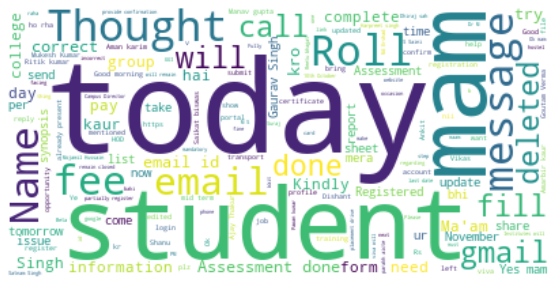

In [24]:
text = " ".join(review for review in messages_df.Message)
print ("There are {} words in all the messages.".format(len(text)))
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

1  Author name:  Khushwant Virdi Ma'am


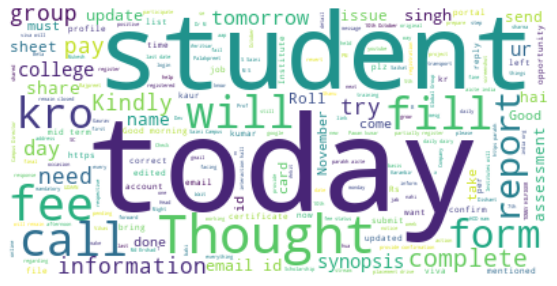

2  Author name:  +880 1996-664936


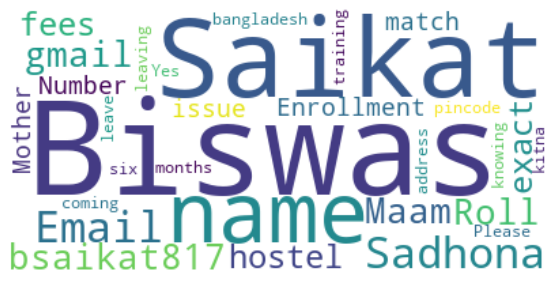

3  Author name:  Karan Chouhan


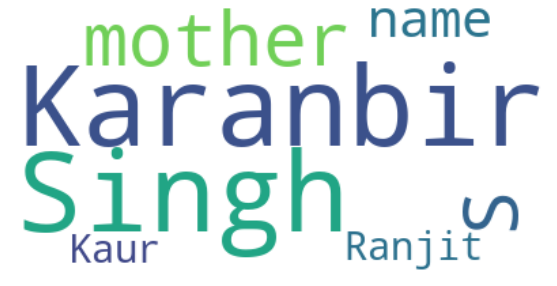

4  Author name:  Harpreet Singh


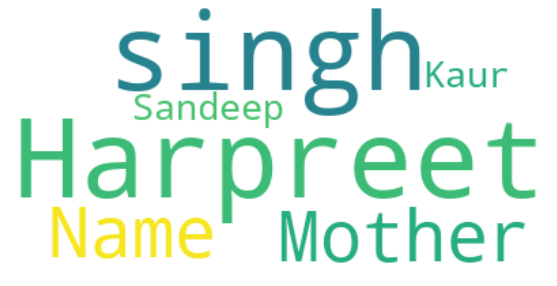

5  Author name:  Rajpreet


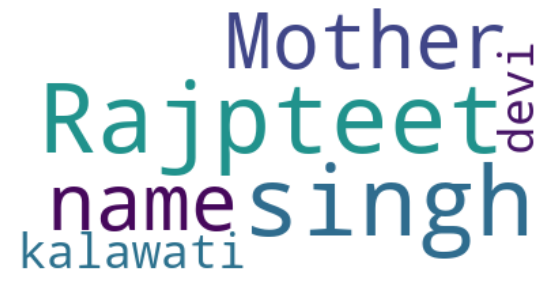

6  Author name:  Suraj Kumar


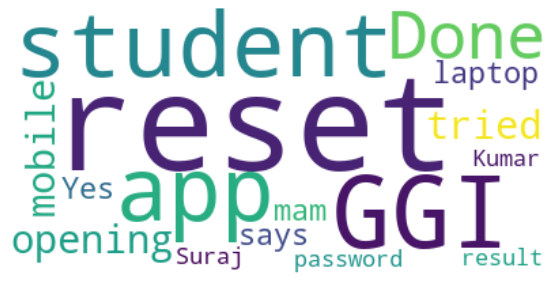

7  Author name:  Dishant


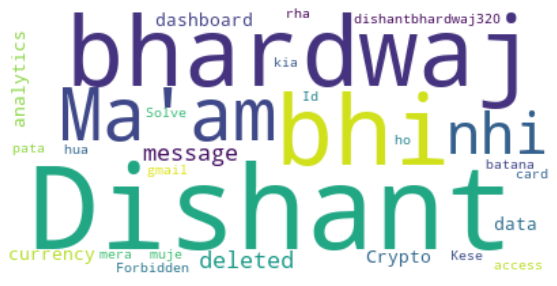

8  Author name:  Satnam Singh


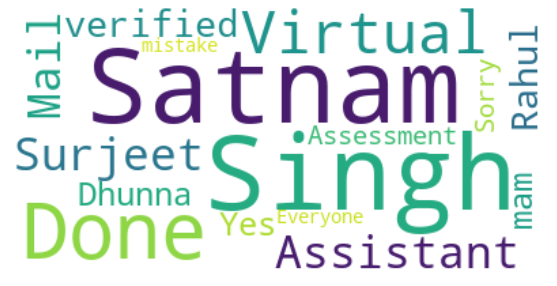

9  Author name:  Priya


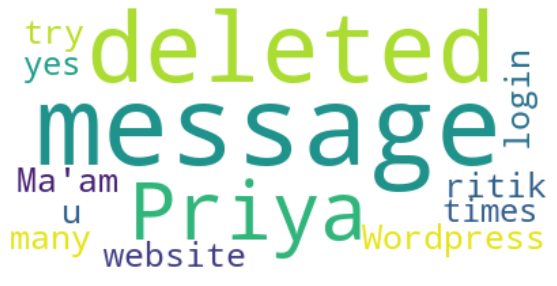

10  Author name:  Gautam Verma


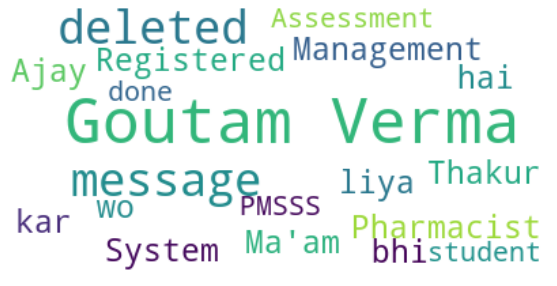

11  Author name:  Dhruv Narula


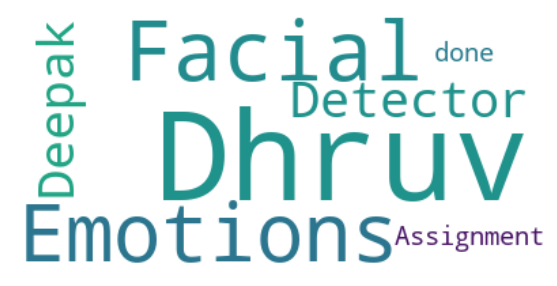

12  Author name:  Rishabh Sharma


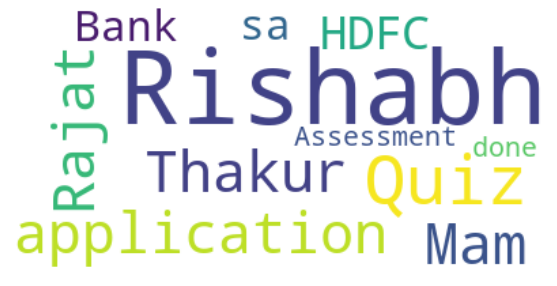

13  Author name:  Avneet


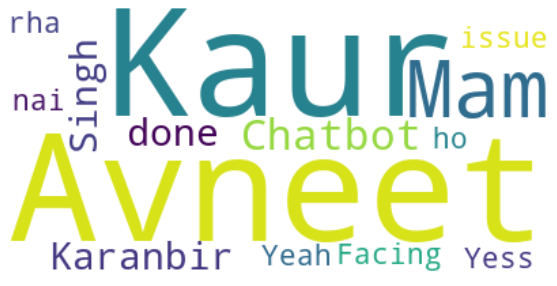

14  Author name:  +91 70876 94872


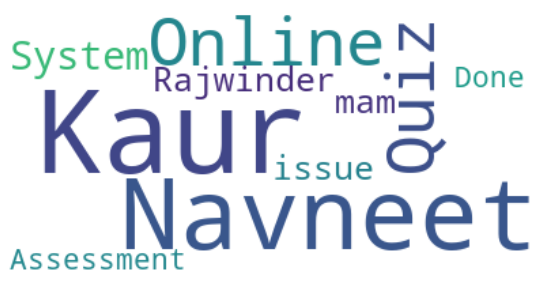

15  Author name:  +91 76077 56307


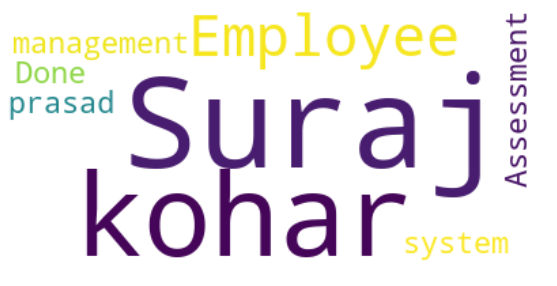

16  Author name:  +91 99356 98094


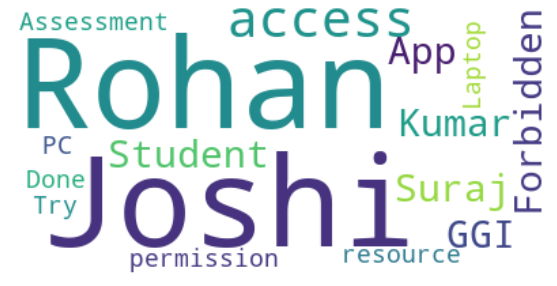

17  Author name:  +91 95011 39915


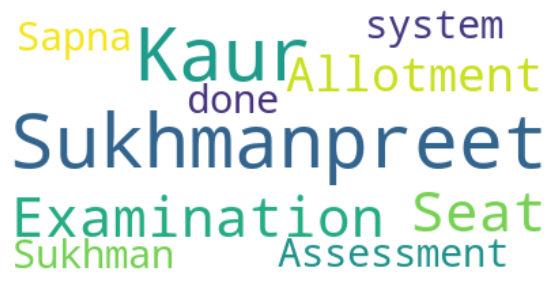

18  Author name:  Jaspreet Kaur


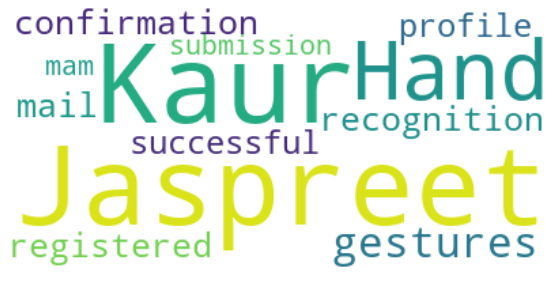

19  Author name:  +91 70910 51953


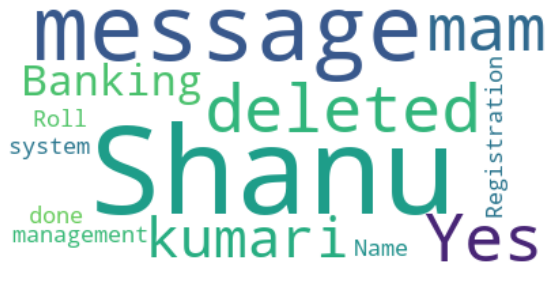

20  Author name:  +91 73472 06012


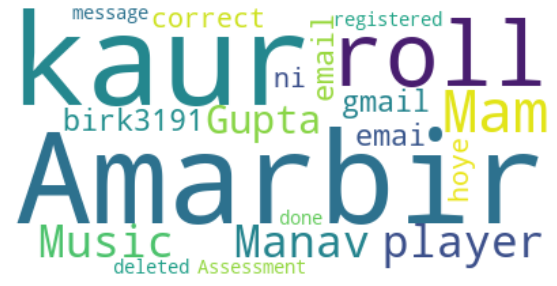

21  Author name:  +91 75469 47907


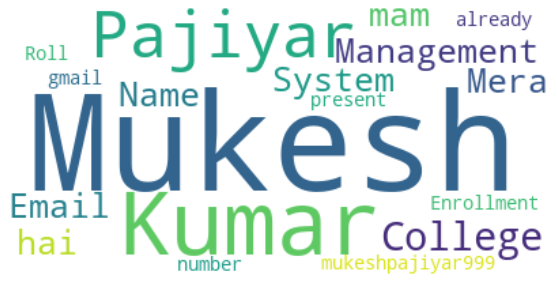

22  Author name:  Aman Karim


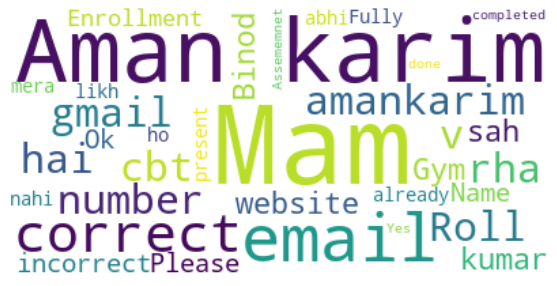

23  Author name:  Divyam


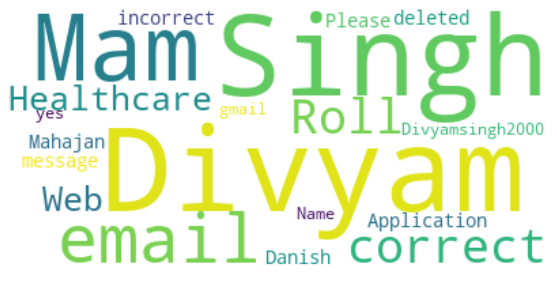

24  Author name:  Chatura


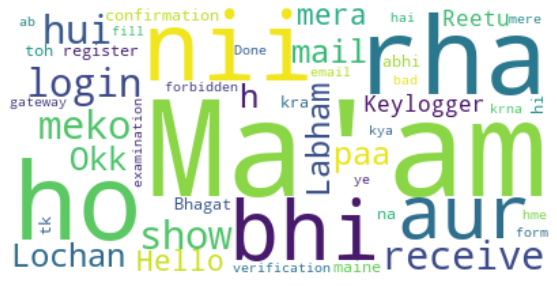

25  Author name:  Gaurav Singh Rajput


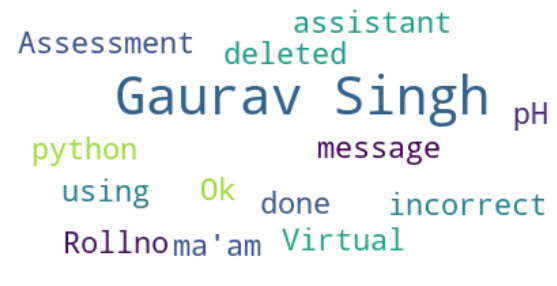

26  Author name:  Dhiraj Sah


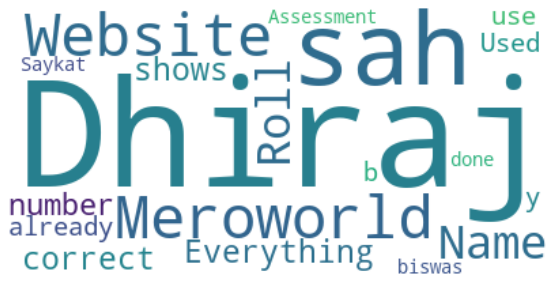

27  Author name:  Manish Kumar


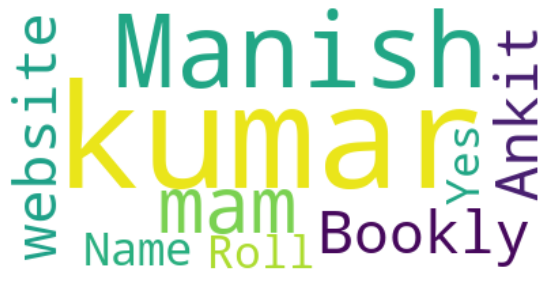

28  Author name:  Musu👩🙆‍♀️🙋‍♀️🌼


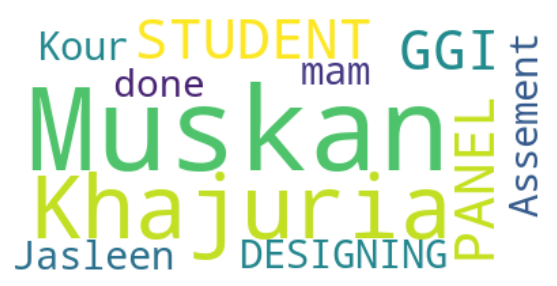

29  Author name:  Manav Mahajan


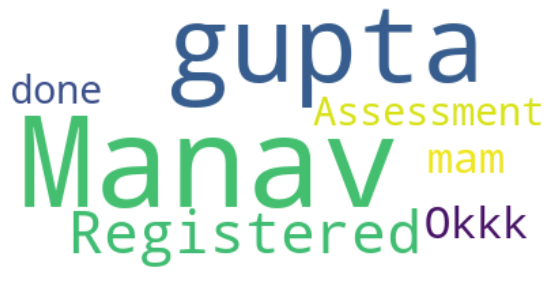

30  Author name:  +91 86387 60290


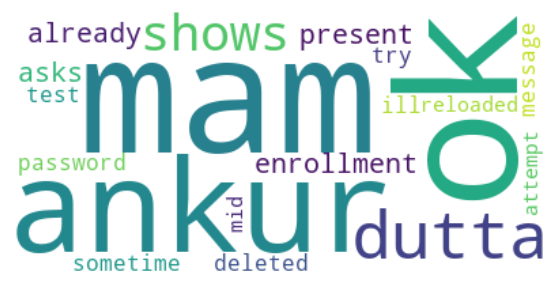

31  Author name:  Mojamil


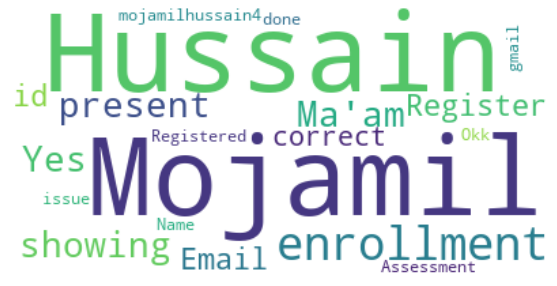

32  Author name:  Mohit Kumar Gupta


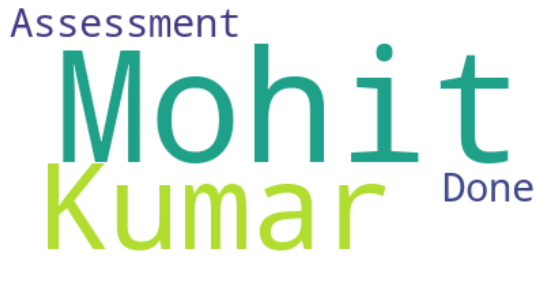

33  Author name:  +91 82199 31126


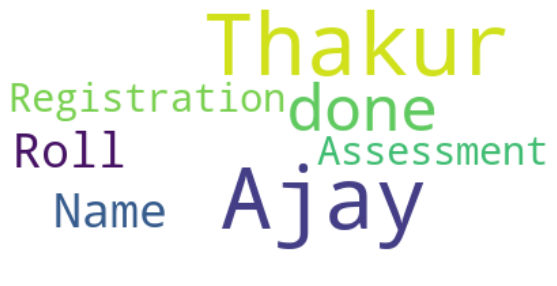

34  Author name:  +91 70519 37907
________________
No Text Present
________________
35  Author name:  +91 86387 59917


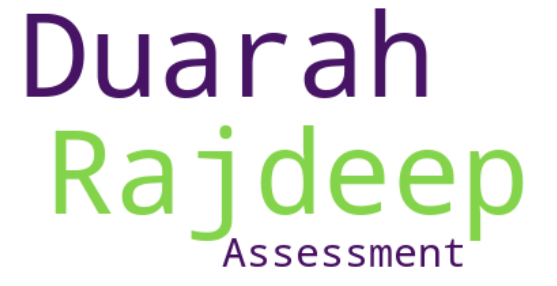

36  Author name:  Smarty


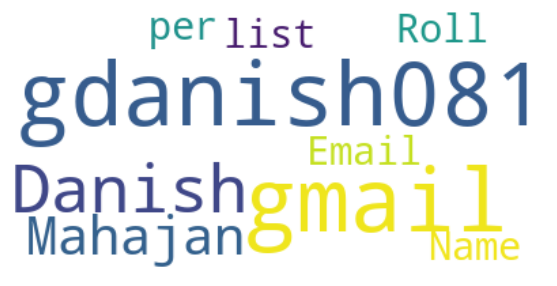

37  Author name:  Anjali Lalotra


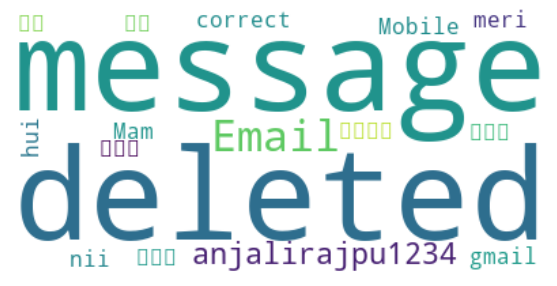

38  Author name:  Manpreet Kaur


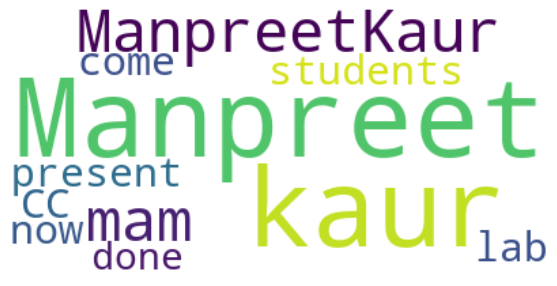

39  Author name:  Vikas


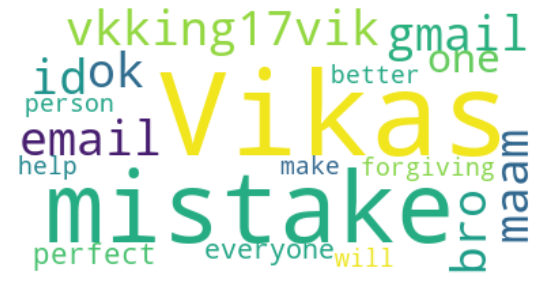

40  Author name:  Reetu Bhagat


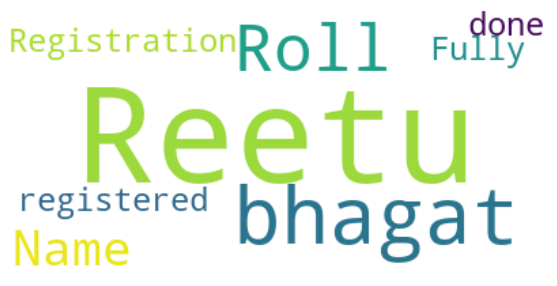

41  Author name:  +91 85808 67020


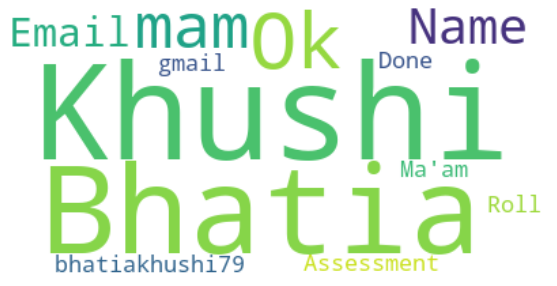

42  Author name:  +91 73240 40725


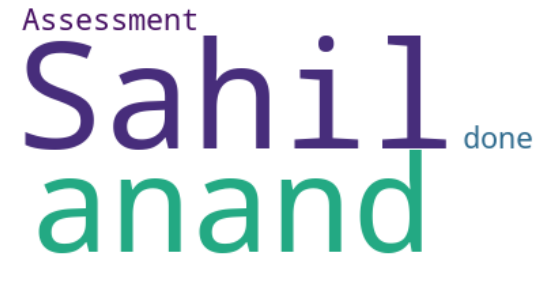

43  Author name:  Ankit Kumar


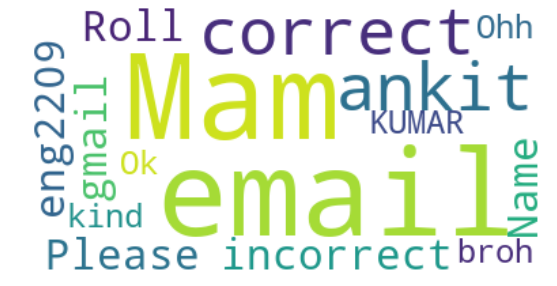

44  Author name:  Argdeep Borah


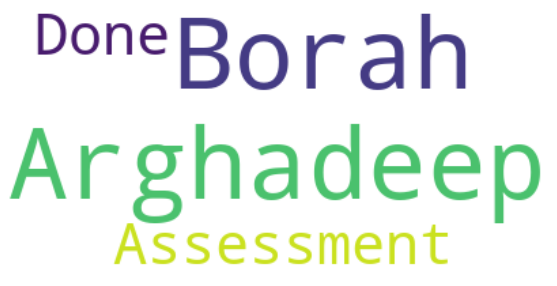

45  Author name:  +91 76259 91241


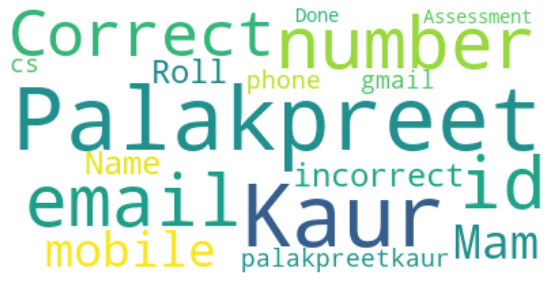

46  Author name:  Vinay


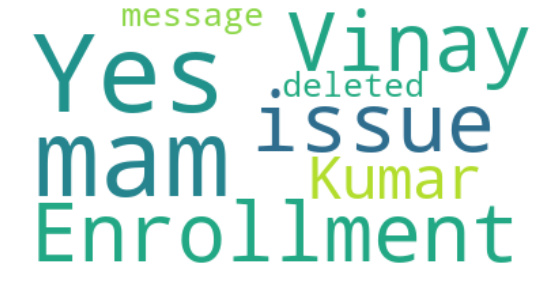

47  Author name:  Eshupreet Kaur


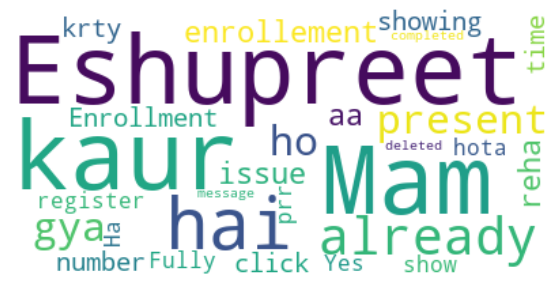

48  Author name:  Dev Sharma


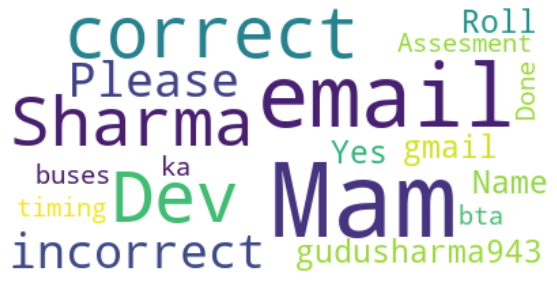

49  Author name:  +91 6280 844 278


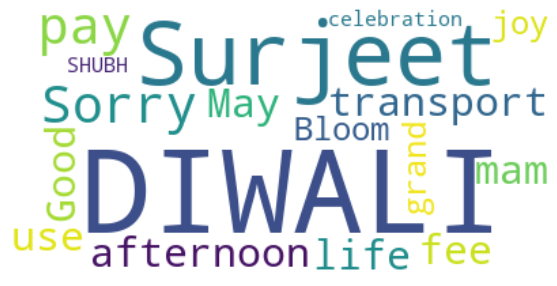

50  Author name:  Ritik


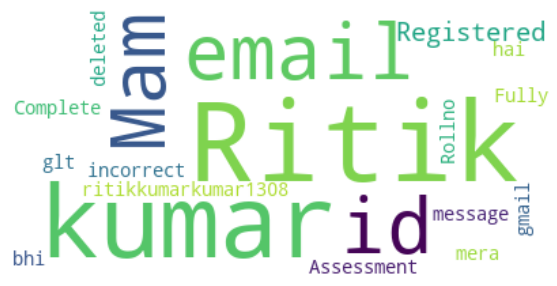

51  Author name:  Dilbagh Singh


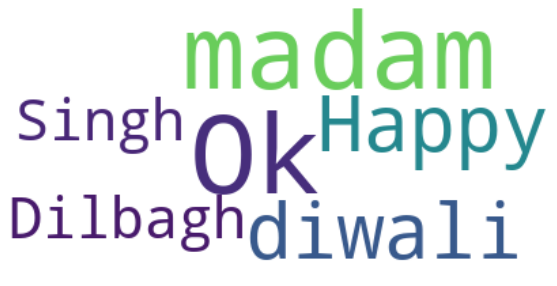

52  Author name:  Rajat Thakur


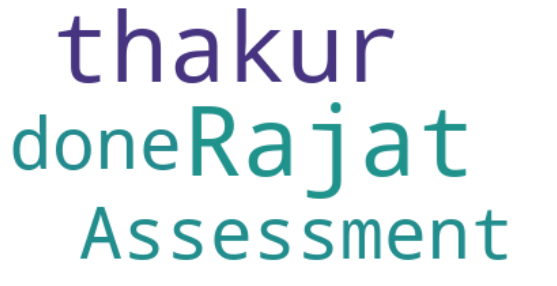

53  Author name:  Sajid Akhtar


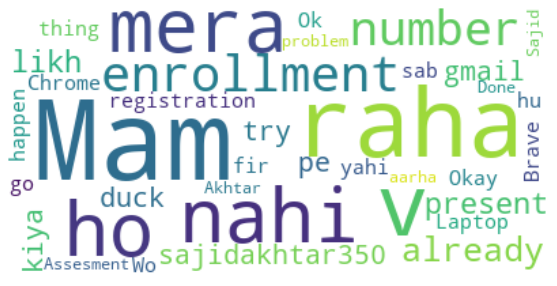

54  Author name:  +91 76529 29908


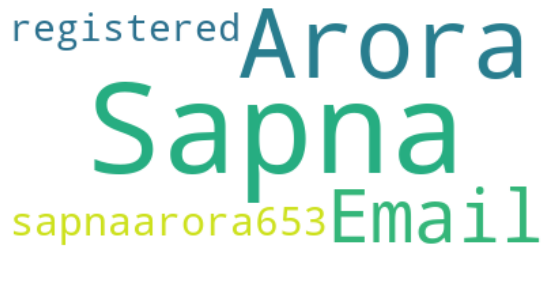

55  Author name:  Deepak Gupta


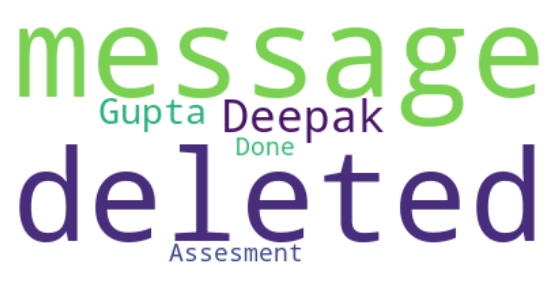

56  Author name:  Juhi Choudhary


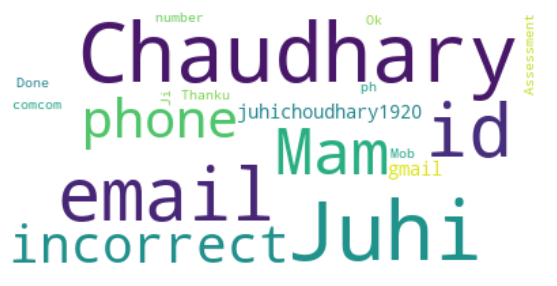

57  Author name:  Jasleen Kour


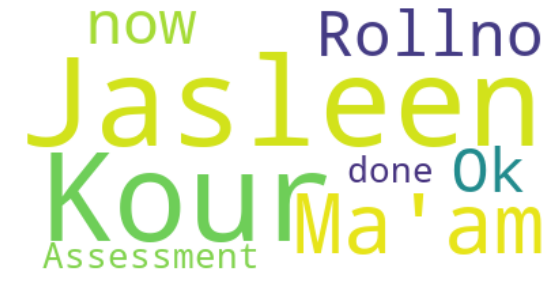

58  Author name:  +91 82840 56189


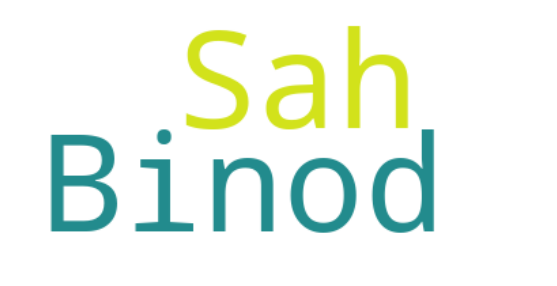

59  Author name:  Chanakya Sharma


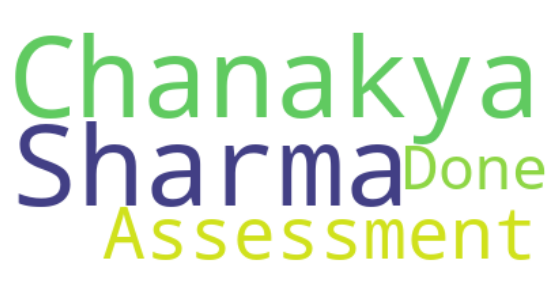

60  Author name:  +91 97810 18975


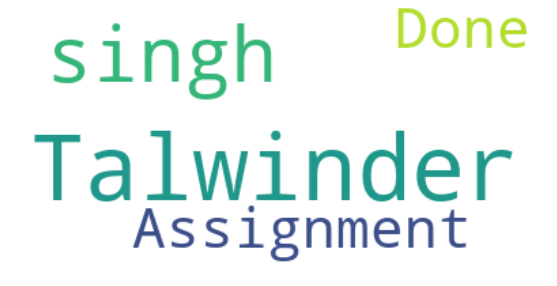

61  Author name:  +91 81461 09032


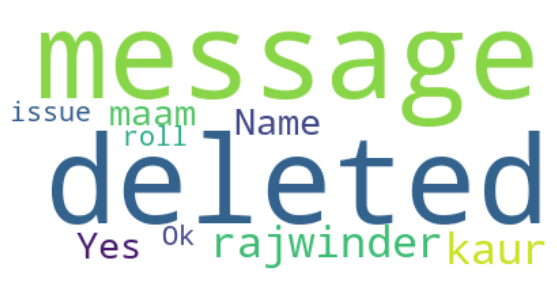

62  Author name:  Rahul
________________
No Text Present
________________
63  Author name:  +91 97795 97952


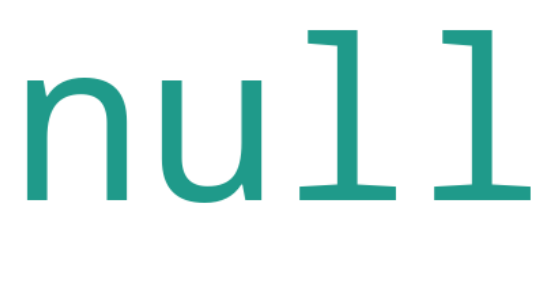

64  Author name:  Shruti


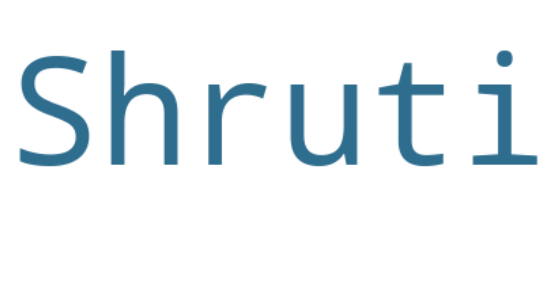

65  Author name:  +91 81021 87129


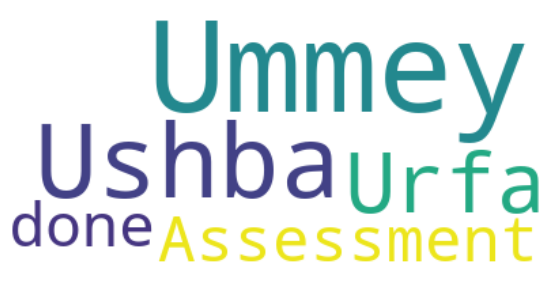

66  Author name:  +91 78898 09723


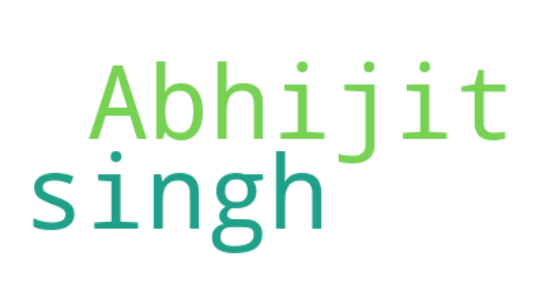

In [25]:


## most common words of each person
l = df['Author'].unique()
for i in range(len(l)):
    dummy_df = messages_df[messages_df['Author'] == l[i]]
    text = " ".join(review for review in dummy_df.Message)
    if len(text) <=2:
        print(i+1,' Author name: ',l[i])
        print('________________')
        print('No Text Present')
        print('________________')
    else:  
        stopwords = set(STOPWORDS)
        #Generate a word cloud image
        print(i+1,' Author name: ',l[i])
        wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
        #Display the generated image   
        plt.figure( figsize=(10,5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()

In [26]:
# df.to_csv('check.csv')   # to check the data preprocessed 

# ----------------------------------------------------------------------------------------------------------

In [27]:
Total_words = []
for msg in df['Message']:
    Total_words.extend(msg.split())

print('Total words: ',len(Total_words))

Total words:  5834


In [28]:
df[df['Message'] == '<Media omitted>']

,Date,Time,Author,Message,24hr_Time,date,year,month_num,month,day,day_name,hour,minute,emoji,urlcount
25,2022-09-21,2:06 pm,Khushwant Virdi Ma'am,<Media omitted>,14:06:00,2022-09-21,2022,9,September,21,Wednesday,14,6,[],0
38,2022-09-27,4:40 pm,Khushwant Virdi Ma'am,<Media omitted>,16:40:00,2022-09-27,2022,9,September,27,Tuesday,16,40,[],0
40,2022-09-27,4:51 pm,Khushwant Virdi Ma'am,<Media omitted>,16:51:00,2022-09-27,2022,9,September,27,Tuesday,16,51,[],0
42,2022-09-28,9:01 am,Khushwant Virdi Ma'am,<Media omitted>,09:01:00,2022-09-28,2022,9,September,28,Wednesday,9,1,[],0
52,2022-09-28,2:02 pm,Khushwant Virdi Ma'am,<Media omitted>,14:02:00,2022-09-28,2022,9,September,28,Wednesday,14,2,[],0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
870,2022-11-24,1:54 pm,+91 78898 09723,<Media omitted>,13:54:00,2022-11-24,2022,11,November,24,Thursday,13,54,[],0
888,2022-11-25,8:51 pm,+91 70519 37907,<Media omitted>,20:51:00,2022-11-25,2022,11,November,25,Friday,20,51,[],0
889,2022-11-25,8:57 pm,Anjali Lalotra,<Media omitted>,20:57:00,2022-11-25,2022,11,November,25,Friday,20,57,[],0
898,2022-11-28,1:30 pm,Khushwant Virdi Ma'am,<Media omitted>,13:30:00,2022-11-28,2022,11,November,28,Monday,13,30,[],0


In [29]:
df[df['Message'] == '<Media omitted>'].shape[0]

159

In [30]:
df['emoji']

1      []
2      []
3      []
5      []
6      []
       ..
907    []
908    []
909    []
910    []
911    []
Name: emoji, Length: 898, dtype: object

In [31]:
# most active authors/users 
df['Author'].value_counts().head()

Khushwant Virdi Ma'am    418
Aman Karim                19
Sajid Akhtar              18
Mojamil                   18
Chatura                   17
Name: Author, dtype: int64

In [32]:
x = df['Author'].value_counts().head()

In [33]:
name = x.index
count = x.values

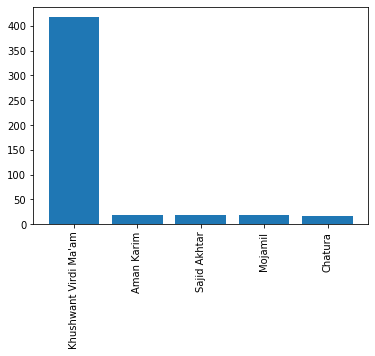

In [34]:
plt.bar(name,count)
plt.xticks(rotation='vertical')
plt.show()

In [35]:
# percentage of messages  
round((df['Author'].value_counts()/df.shape[0])*100,2).reset_index().rename(columns={'index':'Name','Author':'Percentage'} )


,Name,Percentage
0,Khushwant Virdi Ma'am,46.55
1,Aman Karim,2.12
2,Sajid Akhtar,2.00
3,Mojamil,2.00
4,Chatura,1.89
...,...,...
61,+91 82840 56189,0.22
62,+91 97795 97952,0.22
63,Karan Chouhan,0.22
64,+91 78898 09723,0.22


In [36]:
result_df1 = round((df['Author'].value_counts()/df.shape[0])*100,2).reset_index().rename(columns={'index':'Name','Author':'Percentage'} )

result_df1

,Name,Percentage
0,Khushwant Virdi Ma'am,46.55
1,Aman Karim,2.12
2,Sajid Akhtar,2.00
3,Mojamil,2.00
4,Chatura,1.89
...,...,...
61,+91 82840 56189,0.22
62,+91 97795 97952,0.22
63,Karan Chouhan,0.22
64,+91 78898 09723,0.22


In [37]:
result_df2 =df['Author'].value_counts().reset_index().drop('index',axis=1).rename(columns={'Author':'No. of Msgs'} )
result_df2

,No. of Msgs
0,418
1,19
2,18
3,18
4,17
...,...
61,2
62,2
63,2
64,2


In [38]:
result = pd.concat([result_df1, result_df2], axis=1, join="inner")
result

,Name,Percentage,No. of Msgs
0,Khushwant Virdi Ma'am,46.55,418
1,Aman Karim,2.12,19
2,Sajid Akhtar,2.00,18
3,Mojamil,2.00,18
4,Chatura,1.89,17
...,...,...,...
61,+91 82840 56189,0.22,2
62,+91 97795 97952,0.22,2
63,Karan Chouhan,0.22,2
64,+91 78898 09723,0.22,2


In [39]:
df[df['Message'] == '<Media omitted>']

df_filtered = df[df['Message'] != '<Media omitted>']


In [40]:
df_filtered

,Date,Time,Author,Message,24hr_Time,date,year,month_num,month,day,day_name,hour,minute,emoji,urlcount
1,2022-09-13,8:48 am,Khushwant Virdi Ma'am,Only 27 response are there,08:48:00,2022-09-13,2022,9,September,13,Tuesday,8,48,[],0
2,2022-09-13,9:03 am,Khushwant Virdi Ma'am,Jo rehte hai unko call kr k sheet fill karvayu...,09:03:00,2022-09-13,2022,9,September,13,Tuesday,9,3,[],0
3,2022-09-13,9:58 am,Khushwant Virdi Ma'am,Thought of today... A positive mind finds opp...,09:58:00,2022-09-13,2022,9,September,13,Tuesday,9,58,[],0
5,2022-09-13,12:01 pm,Khushwant Virdi Ma'am,Hurry up students.. Those who are left fill th...,12:01:00,2022-09-13,2022,9,September,13,Tuesday,12,1,[],0
6,2022-09-13,1:34 pm,Khushwant Virdi Ma'am,Binod kumar shah Dev sharma Eshupreet gurpreet...,13:34:00,2022-09-13,2022,9,September,13,Tuesday,13,34,[],0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,2022-11-30,5:50 pm,+91 75469 47907,Mukesh Kumar Pajiyar 1904542,17:50:00,2022-11-30,2022,11,November,30,Wednesday,17,50,[],0
908,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,Those who shared individual message. Kindly re...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0
909,2022-11-30,5:51 pm,Gautam Verma,Goutam Verma 1904523 PMSSS student,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0
910,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,With screenshot and date in which you paid the...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0


In [41]:
 df_filtered = df[df['Message'] != '<Media omitted>']

In [42]:
df_filtered = df[df['Message'] != '<Media omitted>']


In [43]:
f = open('stop_hinglish.txt','r')
stop_words = f.read()
print(stop_words)

.
..
...
?
-
--
1
2
3
4
5
6
7
8
9
0
a
aadi
aaj
aap
aapne
aata
aati
aaya
aaye
ab
abbe
abbey
abe
abhi
able
about
above
accha
according
accordingly
acha
achcha
across
actually
after
afterwards
again
against
agar
ain
aint
ain't
aisa
aise
aisi
alag
all
allow
allows
almost
alone
along
already
also
although
always
am
among
amongst
an
and
andar
another
any
anybody
anyhow
anyone
anything
anyway
anyways
anywhere
ap
apan
apart
apna
apnaa
apne
apni
appear
are
aren
arent
aren't
around
arre
as
aside
ask
asking
at
aur
avum
aya
aye
baad
baar
bad
bahut
bana
banae
banai
banao
banaya
banaye
banayi
banda
bande
bandi
bane
bani
bas
bata
batao
bc
be
became
because
become
becomes
becoming
been
before
beforehand
behind
being
below
beside
besides
best
better
between
beyond
bhai
bheetar
bhi
bhitar
bht
bilkul
bohot
bol
bola
bole
boli
bolo
bolta
bolte
bolti
both
brief
bro
btw
but
by
came
can
cannot
cant
can't
cause
causes
certain
certainly
chahiye
chaiye
chal
chalega
chhaiye
clearly
c'mon
com
come
comes
could
coul

In [44]:
words =[]

for msg in df_filtered['Message']:
    for word in msg.lower().split():
        if word not in stop_words:
            words.append(word)
    

In [45]:
from collections import Counter
pd.DataFrame(Counter(words).most_common(100))


,0,1
0,mam,54
1,email,42
2,students,35
3,singh,34
4,kaur,33
...,...,...
95,goutam,6
96,portal,6
97,confirm,6
98,edited,6


In [46]:
result_df20 = pd.DataFrame(Counter(words).most_common(20)).rename(columns={0:'Word', 1 :"Times Repeated"})
result_df100 = pd.DataFrame(Counter(words).most_common(100)).rename(columns={0:'Word', 1 :"Times Repeated"})

In [47]:
result_df100

,Word,Times Repeated
0,mam,54
1,email,42
2,students,35
3,singh,34
4,kaur,33
...,...,...
95,goutam,6
96,portal,6
97,confirm,6
98,edited,6


In [48]:
pd.DataFrame(Counter(words).most_common(20)).rename(columns={0:'Word', 1 :"Times Repeated"})

,Word,Times Repeated
0,mam,54
1,email,42
2,students,35
3,singh,34
4,kaur,33
5,kumar,32
6,assessment,31
7,message,30
8,roll,30
9,fill,26


In [49]:
emojis = []
for msg in df['Message']:
    emojis.extend([c for c in msg if  c in emoji.EMOJI_DATA])

In [50]:
emoji_df = pd.DataFrame(Counter(emojis).most_common(len(Counter(emojis)))).rename(columns={0:'Emoji', 1 :"Times Repeated"})
emoji_df

,Emoji,Times Repeated
0,💥,6
1,🎉,3
2,👍,2
3,🙏,2
4,😥,2
5,✅,1
6,🥲,1


In [68]:
timeline = df.groupby(['year','month','month_num']).count()['Message'].reset_index()
timeline

,year,month,month_num,Message
0,2022,April,4,16
1,2022,August,8,23
2,2022,December,12,1
3,2022,February,2,50
4,2022,January,1,379
5,2022,July,7,34
6,2022,June,6,26
7,2022,March,3,62
8,2022,May,5,34
9,2022,November,11,144


In [69]:
timeline

,year,month,month_num,Message
0,2022,April,4,16
1,2022,August,8,23
2,2022,December,12,1
3,2022,February,2,50
4,2022,January,1,379
5,2022,July,7,34
6,2022,June,6,26
7,2022,March,3,62
8,2022,May,5,34
9,2022,November,11,144


In [70]:
time= []
for i in range(timeline.shape[0]):
    time.append(timeline['month'][i]+'-'+ str(timeline['year'][i]))

In [71]:
timeline['time'] = time
timeline = timeline.sort_values(['year','month_num']).reset_index()
timeline

,index,year,month,month_num,Message,time
0,4,2022,January,1,379,January-2022
1,3,2022,February,2,50,February-2022
2,7,2022,March,3,62,March-2022
3,0,2022,April,4,16,April-2022
4,8,2022,May,5,34,May-2022
5,6,2022,June,6,26,June-2022
6,5,2022,July,7,34,July-2022
7,1,2022,August,8,23,August-2022
8,11,2022,September,9,78,September-2022
9,10,2022,October,10,51,October-2022


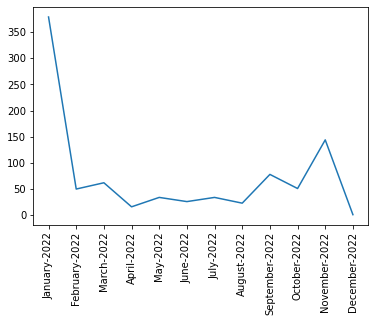

In [72]:
plt.plot(timeline['time'],timeline['Message'])
plt.xticks(rotation='vertical')
plt.show()

In [79]:
## daily timeline 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 898 entries, 1 to 911
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       898 non-null    datetime64[ns]
 1   Time       898 non-null    object        
 2   Author     898 non-null    object        
 3   Message    898 non-null    object        
 4   24hr_Time  898 non-null    object        
 5   date       898 non-null    object        
 6   year       898 non-null    int64         
 7   month_num  898 non-null    int64         
 8   month      898 non-null    object        
 9   day        898 non-null    int64         
 10  day_name   898 non-null    object        
 11  hour       898 non-null    int64         
 12  minute     898 non-null    int64         
 13  emoji      898 non-null    object        
 14  urlcount   898 non-null    int64         
dtypes: datetime64[ns](1), int64(6), object(8)
memory usage: 144.5+ KB


In [75]:
daily_timeline = df.groupby('Date').count()['Message'].reset_index()
daily_timeline

,Date,Message
0,2022-01-10,370
1,2022-01-11,8
2,2022-01-12,1
3,2022-02-10,49
4,2022-02-11,1
5,2022-03-10,59
6,2022-03-11,3
7,2022-04-10,1
8,2022-04-11,15
9,2022-05-10,7


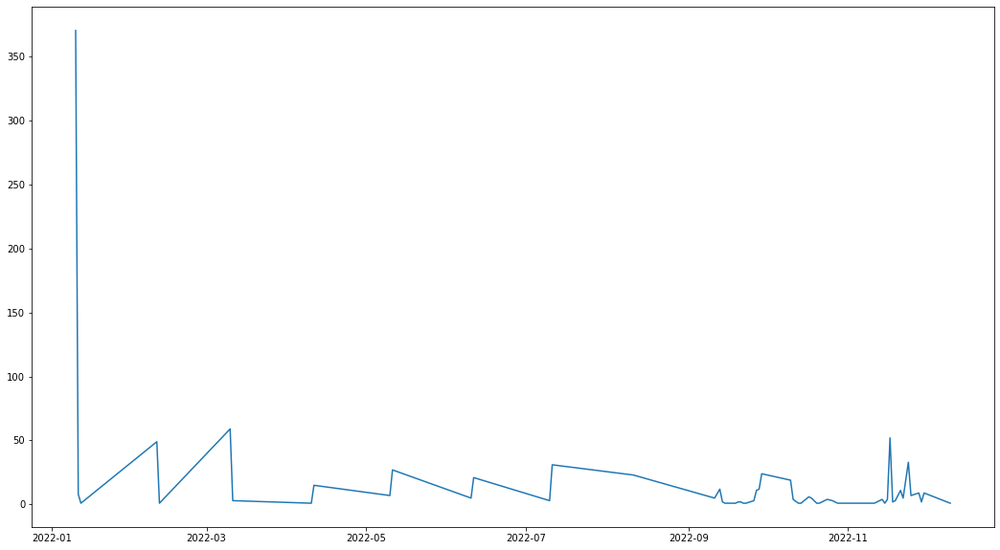

In [80]:
plt.figure(figsize=(18,10))
plt.plot(daily_timeline['Date'],daily_timeline['Message'])

In [82]:
df['day_name'].value_counts()    # activity per day 

Monday       474
Thursday     245
Wednesday     63
Tuesday       57
Saturday      25
Friday        24
Sunday        10
Name: day_name, dtype: int64

In [83]:
df['month'].value_counts()    # activity per month 

January      379
November     144
September     78
March         62
October       51
February      50
May           34
July          34
June          26
August        23
April         16
December       1
Name: month, dtype: int64

In [98]:
period = []    # creating one hour period 
for hour in df[['day_name','hour']]['hour']:
        if hour == 23 :
            period.append(str(hour)+"-"+str('00'))
        elif hour == 0:
            period.append(str("00")+"-"+str(hour+1))
        else:
            period.append(str(hour)+"-"+str(hour+1))

df['hr_period'] = period

In [99]:
df

,Date,Time,Author,Message,24hr_Time,date,year,month_num,month,day,day_name,hour,minute,emoji,urlcount,hr_period
1,2022-09-13,8:48 am,Khushwant Virdi Ma'am,Only 27 response are there,08:48:00,2022-09-13,2022,9,September,13,Tuesday,8,48,[],0,8-9
2,2022-09-13,9:03 am,Khushwant Virdi Ma'am,Jo rehte hai unko call kr k sheet fill karvayu...,09:03:00,2022-09-13,2022,9,September,13,Tuesday,9,3,[],0,9-10
3,2022-09-13,9:58 am,Khushwant Virdi Ma'am,Thought of today... A positive mind finds opp...,09:58:00,2022-09-13,2022,9,September,13,Tuesday,9,58,[],0,9-10
5,2022-09-13,12:01 pm,Khushwant Virdi Ma'am,Hurry up students.. Those who are left fill th...,12:01:00,2022-09-13,2022,9,September,13,Tuesday,12,1,[],0,12-13
6,2022-09-13,1:34 pm,Khushwant Virdi Ma'am,Binod kumar shah Dev sharma Eshupreet gurpreet...,13:34:00,2022-09-13,2022,9,September,13,Tuesday,13,34,[],0,13-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,2022-11-30,5:50 pm,+91 75469 47907,Mukesh Kumar Pajiyar 1904542,17:50:00,2022-11-30,2022,11,November,30,Wednesday,17,50,[],0,17-18
908,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,Those who shared individual message. Kindly re...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0,17-18
909,2022-11-30,5:51 pm,Gautam Verma,Goutam Verma 1904523 PMSSS student,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0,17-18
910,2022-11-30,5:51 pm,Khushwant Virdi Ma'am,With screenshot and date in which you paid the...,17:51:00,2022-11-30,2022,11,November,30,Wednesday,17,51,[],0,17-18


In [100]:
df.pivot_table(index='day_name',columns='hr_period',values='Message',aggfunc='count').fillna(0)

hr_period,00-1,10-11,11-12,12-13,13-14,14-15,15-16,16-17,17-18,18-19,19-20,20-21,21-22,22-23,23-00,6-7,7-8,8-9,9-10
day_name,,,,,,,,,,,,,,,,,,,
Friday,0.0,3.0,0.0,1.0,2.0,2.0,1.0,0.0,0.0,0.0,3.0,2.0,1.0,0.0,0.0,0.0,0.0,5.0,4.0
Monday,0.0,34.0,83.0,79.0,39.0,30.0,15.0,24.0,41.0,18.0,28.0,25.0,20.0,8.0,8.0,0.0,0.0,3.0,19.0
Saturday,0.0,1.0,2.0,0.0,0.0,4.0,0.0,0.0,12.0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
Sunday,0.0,1.0,1.0,0.0,0.0,2.0,2.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
Thursday,0.0,31.0,20.0,35.0,31.0,46.0,11.0,12.0,3.0,10.0,27.0,5.0,2.0,6.0,0.0,0.0,3.0,1.0,2.0
Tuesday,0.0,4.0,2.0,12.0,15.0,6.0,0.0,7.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,6.0
Wednesday,1.0,7.0,12.0,7.0,5.0,6.0,3.0,2.0,6.0,3.0,3.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,3.0
